## Notebook for cleaning the MesoWest weather station data

Author: Wenwen Kong

Updated: 2022-07-15

### About the data
- We focus on five stations in total: KBUR, KCQT, KLAX, KSMO, KVNY
- Data is downloaded from the MesoWest website
- Time period spans 2005 to 2021, and only covers daily data during boreal summer (June to August)
- Example data of KLAX can be found in the github repo where this notebook locates:
    - Downloaded raw data:
        - ./KLAX/24_Hr_High_Temperature/June_2005-2021/*.csv
        - ./KLAX/24_Hr_High_Temperature/July_2005-2021/*.csv
        - ./KLAX/24_Hr_High_Temperature/August_2005-2021/*.csv
        
    - Processed data:
        - ./KLAX/24_Hr_High_Temperature/KLAX_Tmax_June-July-August_*.csv

### Purpose of this notebook: 
- Step 1 Connect the June, July, August files
- Step 2 Clean the data by (1) removing duplicates and (2) dealing with missing values
- Step 3 Basic visualizations
    - Time series of the raw data
    - Summer daily climatologies
    - Daily anomalies with the emperical summer daily climatology removed

### Helpful methods used in this notebook
- pd.dropna()
- pd.to_datetime()
- pd.to_numeric()
- pd.set_index()
- pd.date_range(start=, end=).difference()
- ... ... 

### Load useful libraries 

In [1]:
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt

### Data cleaning 

In [2]:
# ***************************************
#      Set up parameters
# ***************************************

years           = list(range(2005, 2022)) 
days_of_summer  = 92
station         = ['KBUR', 'KCQT', 'KLAX', 'KSMO', 'KVNY']
months          = ['June', 'July', 'August']
var_folder      = '24_Hr_High_Temperature'
var_oldname     = 'air_temp_high_24_hour_set_1'
var_name        = 'Tmax'

# ***************************************
#      Loop through the stations
# ***************************************
for site in station:      
    print("*********************************************************")
    print("******* station = "+site+"  ***********")
    print("*********************************************************")
    # ----- all_dfs is used to store the whole time series 
    all_dfs     = []
        
    # *********************************************************
    #    Loop through the range of year 2005 to year 2021
    # *********************************************************
    for year in years:
        # ---- summer_df is used to store the June to August connected time series 
        summer_df       = []
        for month in months:
            # ---- read in the .csv file
            path        = './'+site+'/'+var_folder+'/'+month+'_2005-2021/'+site+'_'+month+'_'+str(year)+'.csv'
            file        = pd.read_csv(path, skiprows=6, usecols = ['Date_Time', var_oldname])
                    
            # ---- drop all the NaN values
            file_clean  = file.dropna()
                    
            # ---- append to the summer_df
            summer_df.append(file_clean)
                
        # ---- concatenate 
        df      = pd.concat(summer_df)
                
        # ---- rename the column names for simplicity 
        df.rename(columns = {'Date_Time':'DateTime',var_oldname : var_name}, inplace = True)
                
        # ---- reformat the DateTime column to only keep yyyy-mm-dd
        df['DateTime'] = pd.to_datetime(df['DateTime'])
        df['DateTime'] = df['DateTime'].dt.date 
    
        # ---- remove duplicated dates  
        # print(df.index.is_unique)
        # print(df.index.duplicated())
        df.drop_duplicates(subset='DateTime', keep = False, inplace = True)
    
        # ---- convert the 'Tmax' from string to numeric
        df[var_name] = pd.to_numeric(df[var_name])
    
        # *********************************************************
        #    Deal with the missing dates
        # *********************************************************
        if len(df[var_name]) < days_of_summer:
            print("--------------------------------------------------------------------")
            print("Year "+str(year)+" has "+str(days_of_summer - len(df[var_name]))+" missing days")
            
            df           = df.set_index('DateTime')
            df.index     = pd.to_datetime(df.index)
        
            date_range   = pd.date_range(start=str(year)+"-06-01", end=str(year)+"-08-31")
            print(date_range.difference(df.index))
        
            # ---- fill in the missing dates with a missing value
            df           = df.reindex(date_range, fill_value=np.nan)
                
        # *********************************************************
        #    Create a 'DateTime' column 
        # *********************************************************
        df['DateTime'] = pd.to_datetime(pd.date_range(start=str(year)+"-06-01", end=str(year)+"-08-31"))
        df.to_csv('./'+site+'/'+var_folder+'/'+site+'_'+var_name+'_June-July-August_'+str(year)+'.csv')

*********************************************************
******* station = KBUR  ***********
*********************************************************
--------------------------------------------------------------------
Year 2005 has 1 missing days
DatetimeIndex(['2005-06-12'], dtype='datetime64[ns]', freq=None)
--------------------------------------------------------------------
Year 2006 has 1 missing days
DatetimeIndex(['2006-08-10'], dtype='datetime64[ns]', freq=None)
--------------------------------------------------------------------
Year 2007 has 1 missing days
DatetimeIndex(['2007-07-10'], dtype='datetime64[ns]', freq=None)
--------------------------------------------------------------------
Year 2008 has 1 missing days
DatetimeIndex(['2008-07-10'], dtype='datetime64[ns]', freq=None)
--------------------------------------------------------------------
Year 2009 has 2 missing days
DatetimeIndex(['2009-06-26', '2009-07-29'], dtype='datetime64[ns]', freq=None)
-------------------

--------------------------------------------------------------------
Year 2015 has 1 missing days
DatetimeIndex(['2015-06-17'], dtype='datetime64[ns]', freq=None)
--------------------------------------------------------------------
Year 2016 has 2 missing days
DatetimeIndex(['2016-06-01', '2016-06-22'], dtype='datetime64[ns]', freq=None)
--------------------------------------------------------------------
Year 2018 has 3 missing days
DatetimeIndex(['2018-06-12', '2018-06-27', '2018-06-28'], dtype='datetime64[ns]', freq=None)
--------------------------------------------------------------------
Year 2020 has 3 missing days
DatetimeIndex(['2020-08-01', '2020-08-03', '2020-08-04'], dtype='datetime64[ns]', freq=None)
--------------------------------------------------------------------
Year 2021 has 1 missing days
DatetimeIndex(['2021-06-03'], dtype='datetime64[ns]', freq=None)
*********************************************************
******* station = KVNY  ***********
*********************

### In the data cleaning step, we save each summer to one .csv file
### We now create a holistic file that contains all summers

In [3]:
for site in station:
    all_dfs = []
    
    for year in years:
        file    = './'+site+'/'+var_folder+'/'+site+'_'+var_name+'_June-July-August_'+str(year)+'.csv'
        new_df  = pd.read_csv(file, usecols=['DateTime', var_name])
        all_dfs.append(new_df)
    
    all_dfs_concat = pd.concat(all_dfs)
    saveto = './'+site+'/'+var_folder+'/'+site+'_'+var_name+'_June-July-August_'+str(years[0])+'-'+str(years[-1])+'.csv'
    all_dfs_concat.to_csv(saveto)
    
    print('---- '+site+' ---- done')

---- KBUR ---- done
---- KCQT ---- done
---- KLAX ---- done
---- KSMO ---- done
---- KVNY ---- done


---
### Some basic visualization 

In below, we will do some basic visualizations. For simplicity, we only look at two stations: KLAX (Los Angeles International Airport) and KBUR (Burbank - Bob Hope Airport)

---

#### Raw time series 

Text(0.5, 1.0, '2005-2021 June to August Daily Tmax')

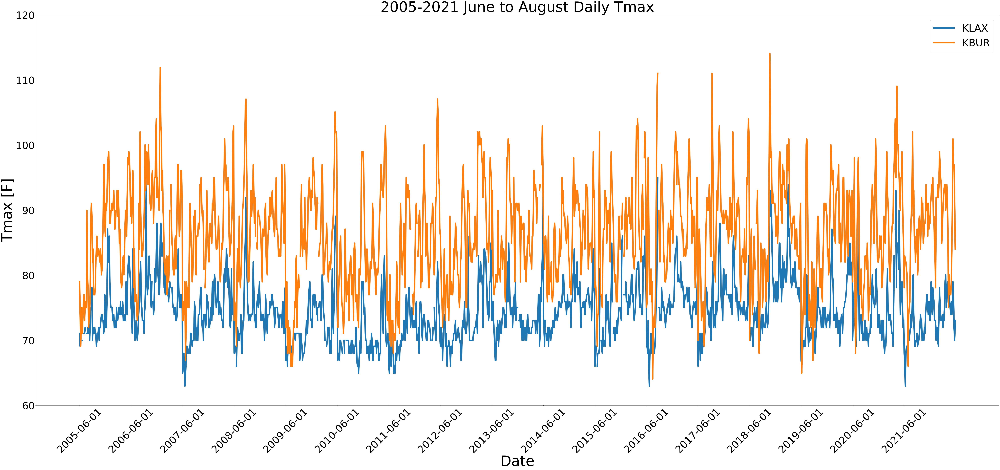

In [12]:
stations = ['KLAX', 'KBUR']
colors  = ['tab:blue', 'tab:orange']

# Create an axes object 
axes    = plt.gca()

for (site, color) in zip(stations, colors):
    file = './'+site+'/'+var_folder+'/'+site+'_'+var_name+'_June-July-August_'+str(years[0])+'-'+str(years[-1])+'.csv'
    df  = pd.read_csv(file, usecols=['DateTime', var_name])
    #df.plot(x = 'DateTime', y = var_name, kind='line',  linewidth=3.0, label = site, color=color, ax=axes)
    plt.plot(df['DateTime'], df[var_name], label = site, color = color, lw = 10)
    
plt.rcParams['figure.figsize'] = (120, 50)
plt.ylim(60, 120)
plt.legend(prop={'size': 70})
plt.xlabel('Date', fontsize = 100)
plt.ylabel(var_name+' [F]', fontsize = 100)
plt.xticks(df['DateTime'][::92], fontsize = 70, rotation = 45)
plt.yticks(fontsize = 70)
plt.title(label = str(years[0])+'-'+str(years[-1])+" June to August Daily "+var_name, fontsize=100)

---
#### Summer daily climatology

(array([ 60.,  65.,  70.,  75.,  80.,  85.,  90.,  95., 100.]),
 <a list of 9 Text yticklabel objects>)

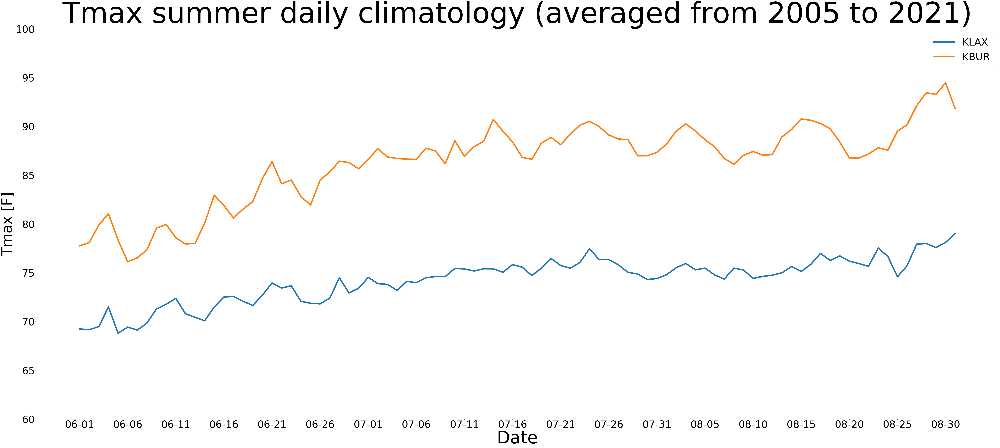

In [5]:
stations = ['KLAX', 'KBUR']
colors  = ['tab:blue', 'tab:orange']
var_folder      = '24_Hr_High_Temperature'
var_oldname     = 'air_temp_high_24_hour_set_1'
var_name        = 'Tmax'
years           = list(range(2005, 2022))
# Create an axes object 
axes    = plt.gca()

for (site, color) in zip(stations, colors):
    file    = './'+site+'/'+var_folder+'/'+site+'_'+var_name+'_June-July-August_'+str(years[0])+'-'+str(years[-1])+'.csv'
    df      = pd.read_csv(file, usecols=['DateTime', var_name])
    df[["year", "month", "day"]] = df["DateTime"].str.split("-", expand = True)
    
    df["monthday"] = df[['month', 'day']].agg('-'.join, axis = 1)
    df_clim = df.groupby(['monthday']).mean().reset_index()
    plt.plot(df_clim['monthday'], df_clim['Tmax'], label = site, color = color, lw = 10)

plt.title(label = var_name+' summer daily climatology (averaged from '+str(years[0])+' to '+str(years[-1])+')', fontsize=200)
plt.rcParams['figure.figsize'] = (120, 50)
plt.ylim(60, 100)
plt.legend(prop={'size': 70})
plt.xlabel('Date', fontsize = 120)
plt.ylabel(var_name+' [F]', fontsize = 100)
plt.xticks(df_clim['monthday'][::5],fontsize = 70)
plt.yticks(fontsize = 70)

---

### Summer daily anomalies with seasonal cycle removed

Now let's remove the seasonal cycle during summer. 

We first taking the station KLAX for example to plot its raw time series overlaid with the seasonal cycle to appreciate the mixed signals. 


In [6]:
site ='KLAX'
file = './'+site+'/'+var_folder+'/'+site+'_'+var_name+'_June-July-August_'+str(years[0])+'-'+str(years[-1])+'.csv'
df   = pd.read_csv(file, usecols=['DateTime', var_name])

# **********************************************************************************************
#     obtain the climatology using groupby and create a new column 'clim' to store the result
# **********************************************************************************************
df[["year", "month", "day"]] = df["DateTime"].str.split("-", expand = True)
df["monthday"] = df[['month', 'day']].agg('-'.join, axis = 1)
df['clim'] = df.groupby(['monthday'])[var_name].transform('mean')

# **********************************************************************************************
#     we can then obtain the daily anomalies with seasonal cycle removed and store in the column 'anom'
# **********************************************************************************************
df['anom'] = df[var_name] - df['clim']

df

,Tmax,DateTime,year,month,day,monthday,clim,anom
0,71.06,2005-06-01,2005,06,01,06-01,69.238824,1.821176
1,69.08,2005-06-02,2005,06,02,06-02,69.164706,-0.084706
2,69.98,2005-06-03,2005,06,03,06-03,69.482353,0.497647
3,69.98,2005-06-04,2005,06,04,06-04,71.492000,-1.512000
4,69.98,2005-06-05,2005,06,05,06-05,68.810000,1.170000
...,...,...,...,...,...,...,...,...
1559,78.98,2021-08-27,2021,08,27,08-27,77.931765,1.048235
1560,77.00,2021-08-28,2021,08,28,08-28,77.995294,-0.995294
1561,71.96,2021-08-29,2021,08,29,08-29,77.582353,-5.622353
1562,69.98,2021-08-30,2021,08,30,08-30,78.111765,-8.131765


---
### Plot of raw time series overlaid with seasonal cycle

In the figure below, blue line denotes the raw daily time series, and for each summer, we overlay the summer climatology averaged across 17 summers in orange. 

(array([ 60.,  65.,  70.,  75.,  80.,  85.,  90.,  95., 100.]),
 <a list of 9 Text yticklabel objects>)

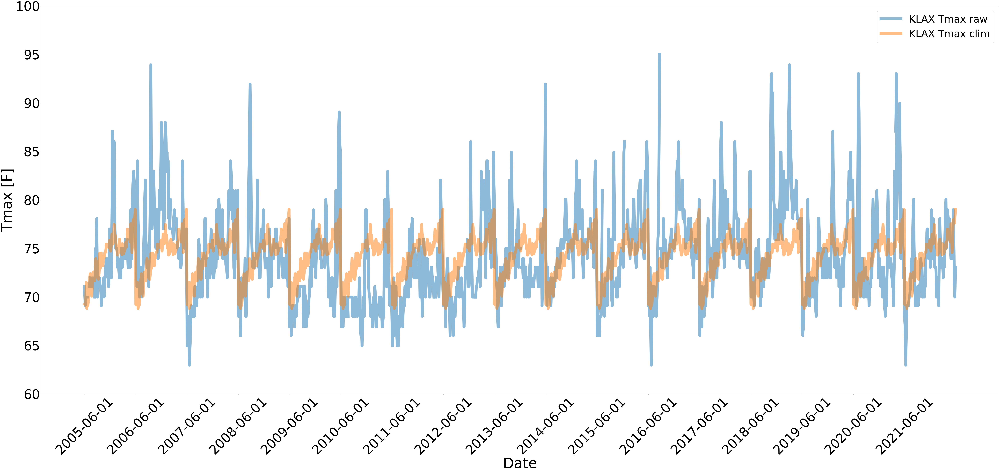

In [7]:
plt.plot(df['DateTime'], df['Tmax'], label = 'KLAX Tmax raw', color = 'tab:blue', lw = 20, alpha = 0.5)
plt.plot(df['DateTime'], df['clim'], label = 'KLAX Tmax clim', color = 'tab:orange', lw = 20, alpha = 0.5)


#plt.title(label = str(years[0])+'-'+str(years[-1])+" June to August Daily "+var_name, fontsize=100)
plt.rcParams['figure.figsize'] = (160, 80)
plt.ylim(60, 100)
plt.legend(prop={'size': 70})
plt.xlabel('Date', fontsize = 100)
plt.ylabel(var_name+' [F]', fontsize = 100)
plt.xticks(df['DateTime'][::92], fontsize = 90, rotation = 45)
plt.yticks(fontsize = 90)

---

### We can now plot the daily anomalies with seasonal cycle removed

(array([-30., -20., -10.,   0.,  10.,  20.,  30.]),
 <a list of 7 Text yticklabel objects>)

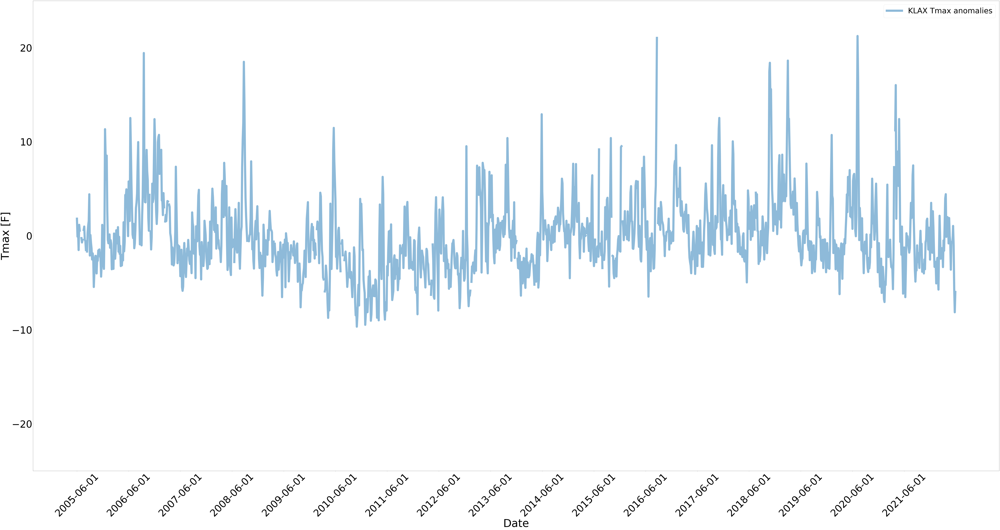

In [8]:
plt.plot(df['DateTime'], df['anom'], label = 'KLAX Tmax anomalies', color = 'tab:blue', lw = 20, alpha = 0.5)
#plt.title(label = str(years[0])+'-'+str(years[-1])+" June to August Daily "+var_name, fontsize=100)
plt.rcParams['figure.figsize'] = (160, 80)
plt.ylim(-25, 25)
plt.legend(prop={'size': 70})
plt.xlabel('Date', fontsize = 100)
plt.ylabel(var_name+' [F]', fontsize = 100)
plt.xticks(df['DateTime'][::92], fontsize = 90, rotation = 45)
plt.yticks(fontsize = 90)

---
### A quick comparison between KLAX and KBUR in terms of their daily anomalies 

(array([-30., -20., -10.,   0.,  10.,  20.,  30.]),
 <a list of 7 Text yticklabel objects>)

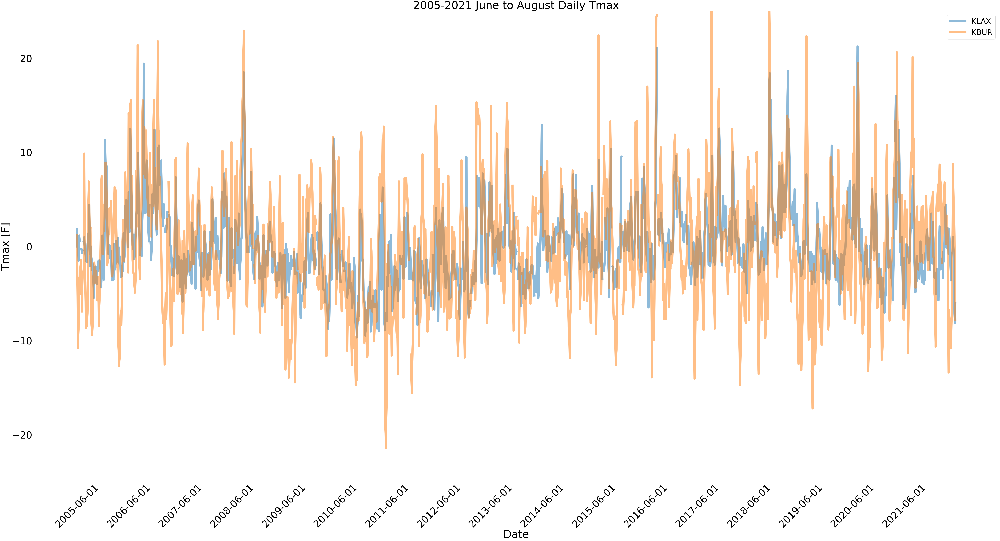

In [9]:
stations = ['KLAX', 'KBUR']
colors   = ['tab:blue', 'tab:orange']

# Create an axes object 
axes    = plt.gca()

for (site, color) in zip(stations, colors):
    file = './'+site+'/'+var_folder+'/'+site+'_'+var_name+'_June-July-August_'+str(years[0])+'-'+str(years[-1])+'.csv'
    df  = pd.read_csv(file, usecols=['DateTime', var_name])
    
    df[["year", "month", "day"]] = df["DateTime"].str.split("-", expand = True)
    df["monthday"] = df[['month', 'day']].agg('-'.join, axis = 1)
    
    df['clim'] = df.groupby(['monthday'])[var_name].transform('mean')
    
    df['anom'] = df[var_name] - df['clim']
    
    plt.plot(df['DateTime'], df['anom'], label = site, color = color, lw = 20, alpha = 0.5)
    #df_anom.plot(x = 'DateTime', y = var_name, kind='line',  linewidth=3.0, label = site, color=color, lw = 20, ax=axes)

plt.title(label = str(years[0])+'-'+str(years[-1])+" June to August Daily "+var_name, fontsize=100)
plt.rcParams['figure.figsize'] = (160, 80)
plt.ylim(-25, 25)
plt.legend(prop={'size': 70})
plt.xlabel('Date', fontsize = 100)
plt.ylabel(var_name+' [F]', fontsize = 100)
plt.xticks(df['DateTime'][::92], fontsize = 90, rotation = 45)
plt.yticks(fontsize = 90)



---
### Play with scatter and trend for daily anomalies 

(array([-30., -20., -10.,   0.,  10.,  20.,  30.]),
 <a list of 7 Text yticklabel objects>)

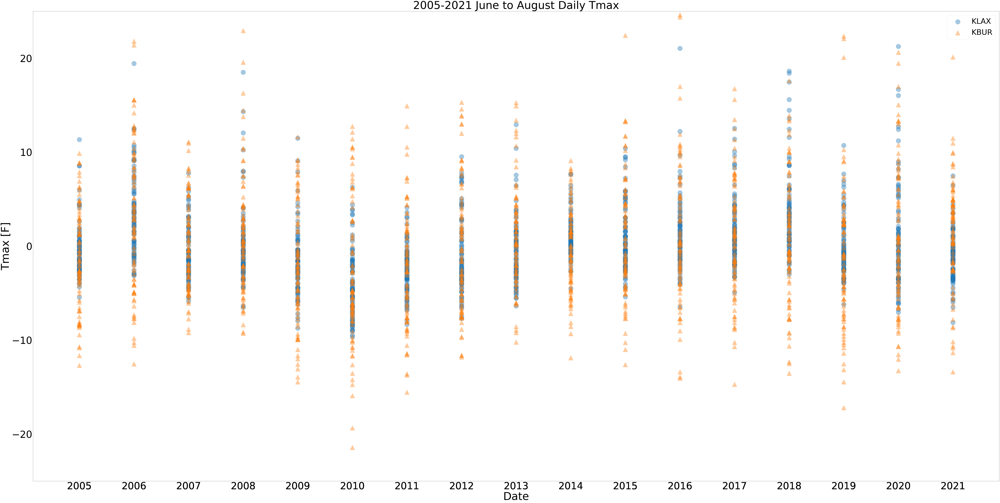

In [10]:
stations = ['KLAX', 'KBUR']
colors   = ['tab:blue', 'tab:orange']
marker   = ['o', '^']

# Create an axes object 
axes    = plt.gca()

for (site, color, marker) in zip(stations, colors, marker):
    file = './'+site+'/'+var_folder+'/'+site+'_'+var_name+'_June-July-August_'+str(years[0])+'-'+str(years[-1])+'.csv'
    df  = pd.read_csv(file, usecols=['DateTime', var_name])
    
    df[["year", "month", "day"]] = df["DateTime"].str.split("-", expand = True)
    df["monthday"] = df[['month', 'day']].agg('-'.join, axis = 1)
    
    df['clim'] = df.groupby(['monthday'])[var_name].transform('mean')
    
    df['anom'] = df[var_name] - df['clim']
    
    x = df['year'].astype(float)
    y = df['anom'].astype(float)
    
    plt.scatter(x, y, s = 2000, label = site, color = color, marker = marker, alpha = 0.4)
    
    #z = np.polyfit(x, y, 1)
    #y_hat = np.poly1d(z)(df['DateTime'])
    #plt.plot(x, y_hat, '-', lw=1)

plt.title(label = str(years[0])+'-'+str(years[-1])+" June to August Daily "+var_name, fontsize=100)
plt.rcParams['figure.figsize'] = (160, 80)
plt.ylim(-25, 25)
plt.legend(prop={'size': 70})
plt.xlabel('Date', fontsize = 100)
plt.ylabel(var_name+' [F]', fontsize = 100)
plt.xticks(x[::1], fontsize = 90)
plt.yticks(fontsize = 90)

### Note:
We would want to see whether we can generate a linear fit for the above scatter plot. However, there are several issues:

1. An obvious issue is that our MesoWest timeseries is too short, so it's difficult to see the trend

2. When I tried to generate the linear fit, I got the error message:

> LinAlgError: SVD did not converge in Linear Least Squares


### Next step:

1. Try quantile regression for the data

2. See whether GSOD, which has longer time span, might be a more helpful data source to use